<a href="https://colab.research.google.com/github/sandeepss2020/Computer_Vision/blob/main/CV_LAB6_EDGE_DETECT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np


(-0.5, 299.5, 299.5, -0.5)

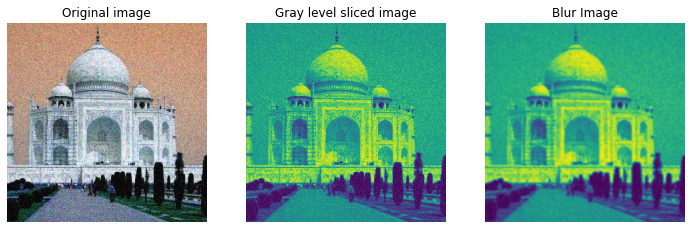

In [ ]:
original_img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/taj.jpg',cv2.IMREAD_COLOR)
gray = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)
blur_img = cv2.GaussianBlur(gray,(5,5),0)
plt.figure(figsize=(25, 5), constrained_layout=False)
plt.subplot(161), plt.imshow(original_img), plt.title("Original image")
plt.axis('off')
plt.subplot(162), plt.imshow(gray), plt.title("Gray level sliced image")
plt.axis('off')
plt.subplot(163), plt.imshow(blur_img), plt.title("Blur Image")
plt.axis('off')


In [ ]:
#Sobel Edge Detection
sobelx = cv2.Sobel(src=blur_img, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) #ddepth=-1 / CV_64F, 
#the destination image will have the same depth as the source. 
filtered_image_x = cv2.convertScaleAbs(sobelx)
 
sobely = cv2.Sobel(src=blur_img, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5)
filtered_image_y = cv2.convertScaleAbs(sobely)
 
sobelxy = cv2.Sobel(src=blur_img, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5)
filtered_image_xy = cv2.convertScaleAbs(sobelxy)


In [ ]:
#Canny Edge Detection
#edges = cv2.Canny(img,100,200, aperture_size =3, L2gradient = True ) aperture_size=sobel kerenel size L2gradient is gradient magnitude 
Cedges = cv2.Canny(image=blur_img, threshold1=100, threshold2=200)


In [ ]:
 #Laplacian edge detector
laplacian = cv2.Laplacian(blur_img,5,cv2.CV_64F)
Lfiltered_image = cv2.convertScaleAbs(laplacian) # Covert image back to gray scale


In [ ]:
#prewitt
kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
img_prewittx = cv2.filter2D(blur_img, -1, kernelx)
img_prewitty = cv2.filter2D(blur_img, -1, kernely)
FullPrewitty=cv2.add(img_prewittx, img_prewitty)


In [ ]:
#Robert Edge Detection
Rkernelx = np.array([[1, 0], [0, -1]])
Rkernely = np.array([[0, 1], [-1, 0]])

img_robertx = cv2.filter2D(blur_img, -1, Rkernelx)
img_roberty = cv2.filter2D(blur_img, -1, Rkernely)
#cv2.imshow("Prewitt", img_prewittx + img_prewitty)
FullRobert = cv2.add(img_robertx, img_roberty)





Text(0.5, 1.0, 'Robert Edge')

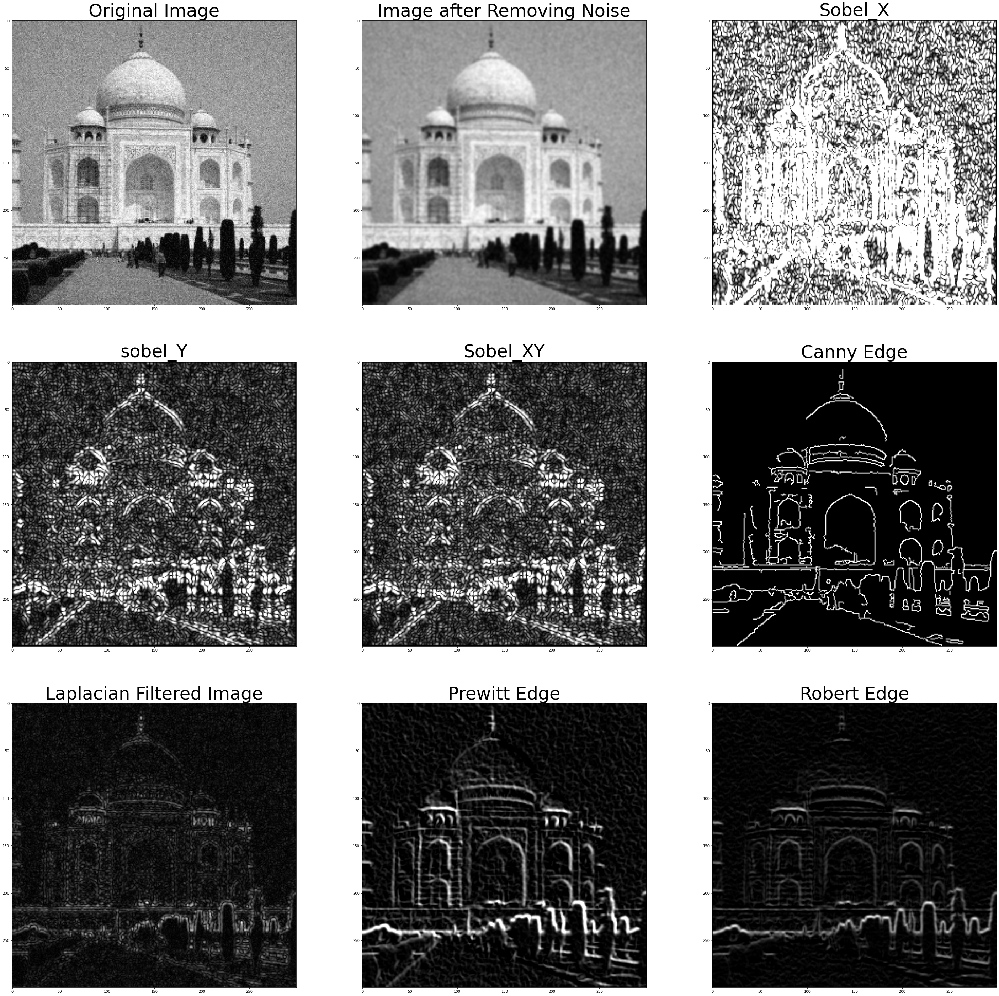

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(50, 50))
ax[0, 0].imshow(gray, "gray")
ax[0, 0].set_title('Original Image',fontsize = 50)

ax[0, 1].imshow(blur_img, "gray")
ax[0, 1].set_title('Image after Removing Noise',fontsize = 50)

ax[0, 2].imshow(filtered_image_x, "gray")
ax[0, 2].set_title('Sobel_X',fontsize = 50)


ax[1, 0].imshow(filtered_image_xy, "gray")
ax[1, 0].set_title('sobel_Y',fontsize = 50)

ax[1, 1].imshow(filtered_image_xy, "gray")
ax[1, 1].set_title('Sobel_XY',fontsize = 50)
ax[1, 2].imshow(Cedges, "gray")
ax[1, 2].set_title('Canny Edge',fontsize = 50)


ax[2, 0].imshow(Lfiltered_image, "gray")
ax[2, 0].set_title('Laplacian Filtered Image',fontsize = 50)
ax[2, 1].imshow(FullPrewitty, "gray")
ax[2, 1].set_title('Prewitt Edge',fontsize = 50)
ax[2, 2].imshow(FullRobert, "gray")
ax[2, 2].set_title('Robert Edge',fontsize = 50)

-->Roberts filtering: diagonal edge gradients. Not very useful for edge detection. It is not symmetric and cannot be generalized to detect edges that are multiples of 45 degree.

--> Prewitt filter: It functions similar to the Sobel operator, by computing the gradient for the image intensity function. Makes use of the maximum directional gradient. but it will produce somewhat noisy result.


--> Sobel filter: Detects edges are where the gradient magnitude is high.This makes the Sobel edge detector more sensitive to diagonal edge than horizontal and vertical edges. 

--> Laplacian - 2nd order derivative. It exactly detects the edge location and analyzes the wider area around the pixels. Images are smoothed with Gaussian smoothing filter to decrease the sensitivity of noise.

-->canny - If a pixel gradient is higher than the upper threshold, the pixel is accepted as an edge.
If a pixel gradient value is below the lower threshold, then it is rejected.
    If the pixel gradient is between the two thresholds, then edge linking performed by incorporating weak pixels that are connected to the strong pixels



SOBEL

In [11]:

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Open the image
img = np.array(Image.open('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/taj.jpg')).astype(np.uint8)

# Apply gray scale
gray_img = np.round(0.299 * img[:, :, 0] +
                    0.587 * img[:, :, 1] +
                    0.114 * img[:, :, 2]).astype(np.uint8)

# Sobel Operator
h, w = gray_img.shape
# define filters
horizontal = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])  # s2
vertical = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])  # s1

# define images with 0s
newhorizontalImage = np.zeros((h, w))
newverticalImage = np.zeros((h, w))
newgradientImage = np.zeros((h, w))

# offset by 1
for i in range(1, h - 1):
    for j in range(1, w - 1):
        horizontalGrad = (horizontal[0, 0] * gray_img[i - 1, j - 1]) + \
                         (horizontal[0, 1] * gray_img[i - 1, j]) + \
                         (horizontal[0, 2] * gray_img[i - 1, j + 1]) + \
                         (horizontal[1, 0] * gray_img[i, j - 1]) + \
                         (horizontal[1, 1] * gray_img[i, j]) + \
                         (horizontal[1, 2] * gray_img[i, j + 1]) + \
                         (horizontal[2, 0] * gray_img[i + 1, j - 1]) + \
                         (horizontal[2, 1] * gray_img[i + 1, j]) + \
                         (horizontal[2, 2] * gray_img[i + 1, j + 1])

        newhorizontalImage[i - 1, j - 1] = abs(horizontalGrad)

        verticalGrad = (vertical[0, 0] * gray_img[i - 1, j - 1]) + \
                       (vertical[0, 1] * gray_img[i - 1, j]) + \
                       (vertical[0, 2] * gray_img[i - 1, j + 1]) + \
                       (vertical[1, 0] * gray_img[i, j - 1]) + \
                       (vertical[1, 1] * gray_img[i, j]) + \
                       (vertical[1, 2] * gray_img[i, j + 1]) + \
                       (vertical[2, 0] * gray_img[i + 1, j - 1]) + \
                       (vertical[2, 1] * gray_img[i + 1, j]) + \
                       (vertical[2, 2] * gray_img[i + 1, j + 1])

        newverticalImage[i - 1, j - 1] = abs(verticalGrad)

        # Edge Magnitude
        mag = np.sqrt(pow(horizontalGrad, 2.0) + pow(verticalGrad, 2.0))
        newgradientImage[i - 1, j - 1] = mag

plt.figure()
# plt.title('taj-sobel.png')
plt.imsave('taj-sobel.png', newgradientImage, cmap='gray', format='png')
# plt.imshow(newgradientImage, cmap='gray')
# plt.show()


<Figure size 432x288 with 0 Axes>

PREWIT

In [9]:

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Open the image
img = np.array(Image.open('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/taj.jpg')).astype(np.uint8)

# Apply gray scale
gray_img = np.round(0.299 * img[:, :, 0] +
                    0.587 * img[:, :, 1] +
                    0.114 * img[:, :, 2]).astype(np.uint8)

# Prewitt Operator
h, w = gray_img.shape
# define filters
horizontal = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])  # s2
vertical = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])  # s1

# define images with 0s
newgradientImage1 = np.zeros((h, w))

# offset by 1
for i in range(1, h - 1):
    for j in range(1, w - 1):
        horizontalGrad = (horizontal[0, 0] * gray_img[i - 1, j - 1]) + \
                         (horizontal[0, 1] * gray_img[i - 1, j]) + \
                         (horizontal[0, 2] * gray_img[i - 1, j + 1]) + \
                         (horizontal[1, 0] * gray_img[i, j - 1]) + \
                         (horizontal[1, 1] * gray_img[i, j]) + \
                         (horizontal[1, 2] * gray_img[i, j + 1]) + \
                         (horizontal[2, 0] * gray_img[i + 1, j - 1]) + \
                         (horizontal[2, 1] * gray_img[i + 1, j]) + \
                         (horizontal[2, 2] * gray_img[i + 1, j + 1])

        verticalGrad = (vertical[0, 0] * gray_img[i - 1, j - 1]) + \
                       (vertical[0, 1] * gray_img[i - 1, j]) + \
                       (vertical[0, 2] * gray_img[i - 1, j + 1]) + \
                       (vertical[1, 0] * gray_img[i, j - 1]) + \
                       (vertical[1, 1] * gray_img[i, j]) + \
                       (vertical[1, 2] * gray_img[i, j + 1]) + \
                       (vertical[2, 0] * gray_img[i + 1, j - 1]) + \
                       (vertical[2, 1] * gray_img[i + 1, j]) + \
                       (vertical[2, 2] * gray_img[i + 1, j + 1])

        # Edge Magnitude
        mag = np.sqrt(pow(horizontalGrad, 2.0) + pow(verticalGrad, 2.0))
        newgradientImage1[i - 1, j - 1] = mag


plt.figure()
# plt.title('taj-prewitt.png')
plt.imsave('taj-prewitt.png', newgradientImage1, cmap='gray', format='png')
# plt.imshow(newgradientImage, cmap='gray')
# plt.show()

<Figure size 432x288 with 0 Axes>

In [16]:
import cv2
import matplotlib.pyplot as plt

# Open the image
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/taj.jpg')
# Apply gray scale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply gaussian blur
blur_img = cv2.GaussianBlur(gray_img, (3, 3), 0)

# Positive Laplacian Operator
laplacian = cv2.Laplacian(blur_img, cv2.CV_64F)

plt.figure()
# plt.title('Shapes')
plt.imsave('TAJlap.png', laplacian, cmap='gray', format='png')
# plt.imshow(laplacian, cmap='gray')
# plt.show()

<Figure size 432x288 with 0 Axes>

In [18]:

import cv2
import matplotlib.pyplot as plt

# Open the image
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/taj.jpg')

# Apply Canny
edges1 = cv2.Canny(img, 100, 200, 3, L2gradient=True)

plt.figure()
# plt.title('Spider')
plt.imsave('TAJcanny.png', edges1, cmap='gray', format='png')
# plt.imshow(edges1, cmap='gray')
# plt.show()

<Figure size 432x288 with 0 Axes>

Text(0.5, 1.0, 'CANNY Image')

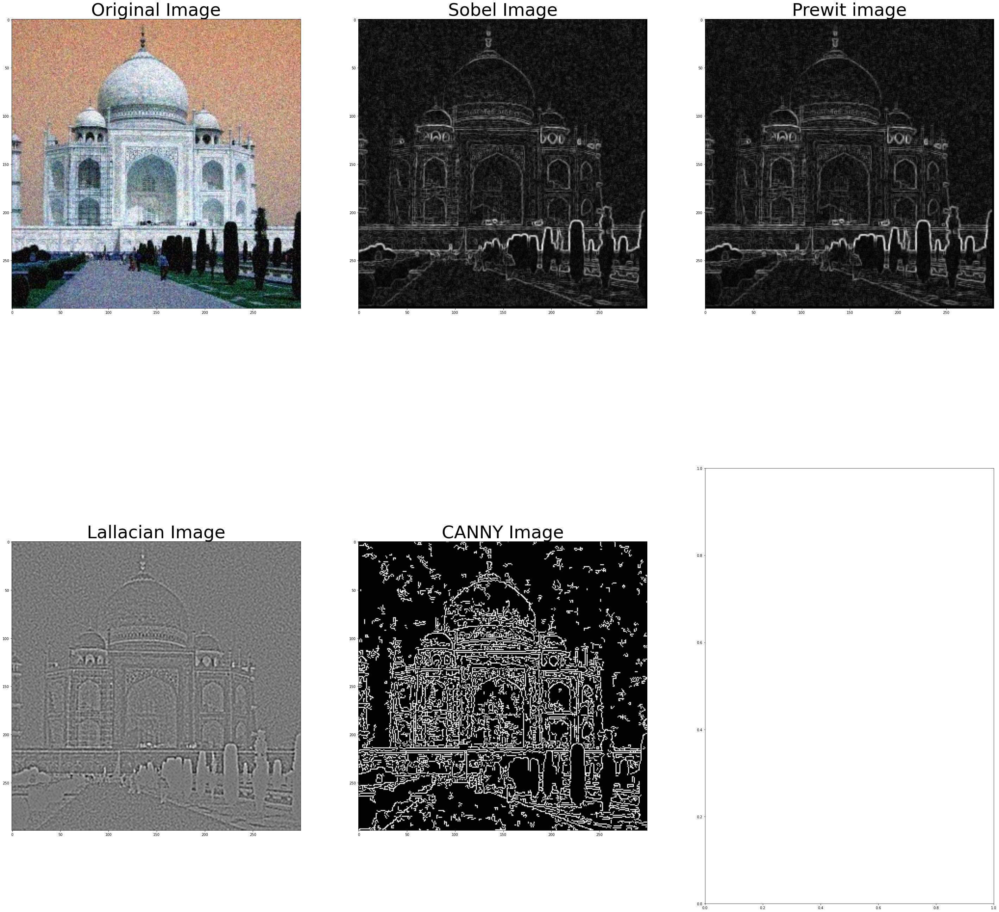

In [19]:
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(50, 50))
ax[0, 0].imshow(img, "gray")
ax[0, 0].set_title('Original Image',fontsize = 50)

ax[0, 1].imshow(newgradientImage, "gray")
ax[0, 1].set_title('Sobel Image',fontsize = 50)

ax[0, 2].imshow(newgradientImage1, "gray")
ax[0, 2].set_title('Prewit image',fontsize = 50)

ax[1, 0].imshow(laplacian, "gray")
ax[1, 0].set_title('Lallacian Image',fontsize = 50)

ax[1, 1].imshow(edges1, "gray")
ax[1, 1].set_title('CANNY Image',fontsize = 50)
